<a href="https://colab.research.google.com/github/sushmanthreddy/GSOC_2023/blob/main/notebooks/explore_preprocess_cell_tracking_challeneg_dataset.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

**Exploring cell_tracking_challenge_dataset**

1.   The dataset is sourced from [cell tracking challenge dataset](http://celltrackingchallenge.net/3d-datasets/) the dataset has real and ground truth of image
2.   The following dataset is 3d video dataset in TIF format



In [ ]:
#mounting google drive over the colab
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
#adding files to content folder 
!rsync -a /content/drive/MyDrive/my_data/Fluo-N3DH-CE.zip  /content/

In [ ]:
#the command to unzip files from drive
!unzip /content/Fluo-N3DH-CE.zip

In [ ]:
#installing simpleITK for handling tif files
!pip install SimpleITK

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 52.7/52.7 MB 11.0 MB/s eta 0:00:00


In [ ]:
#importing libraries
import matplotlib.pyplot as plt
import numpy as np
import os
import cv2
import SimpleITK as sitk
import plotly.express as px
import plotly.graph_objects as go

In [ ]:
#function to read image files and convert to numpy array
def load_img_from_tiff(path2img):
    img = sitk.ReadImage(path2img)
    img_array = sitk.GetArrayFromImage(img)
    return(img_array)

In [ ]:
#this fuction to dislay images in grid for after converting as tiff file
import matplotlib.pyplot as plt

def display_images(images, titles=None, cols=5):
    """Displays multiple images in a grid using Matplotlib.
    Args:
        images (List[np.ndarray]): List of image arrays to display.
        titles (List[str], optional): List of titles for each image. Defaults to None.
        cols (int, optional): Number of columns in the grid. Defaults to 5.
    """
    rows = (len(images) + cols - 1) // cols
    fig, axes = plt.subplots(rows, cols, figsize=(12, 15))
    axes = axes.flatten()

    for i, image in enumerate(images):
        axes[i].imshow(image, cmap='magma')
        axes[i].axis('off')
        if titles is not None:
            axes[i].set_title(titles[i])
    
    plt.tight_layout()
    plt.show()


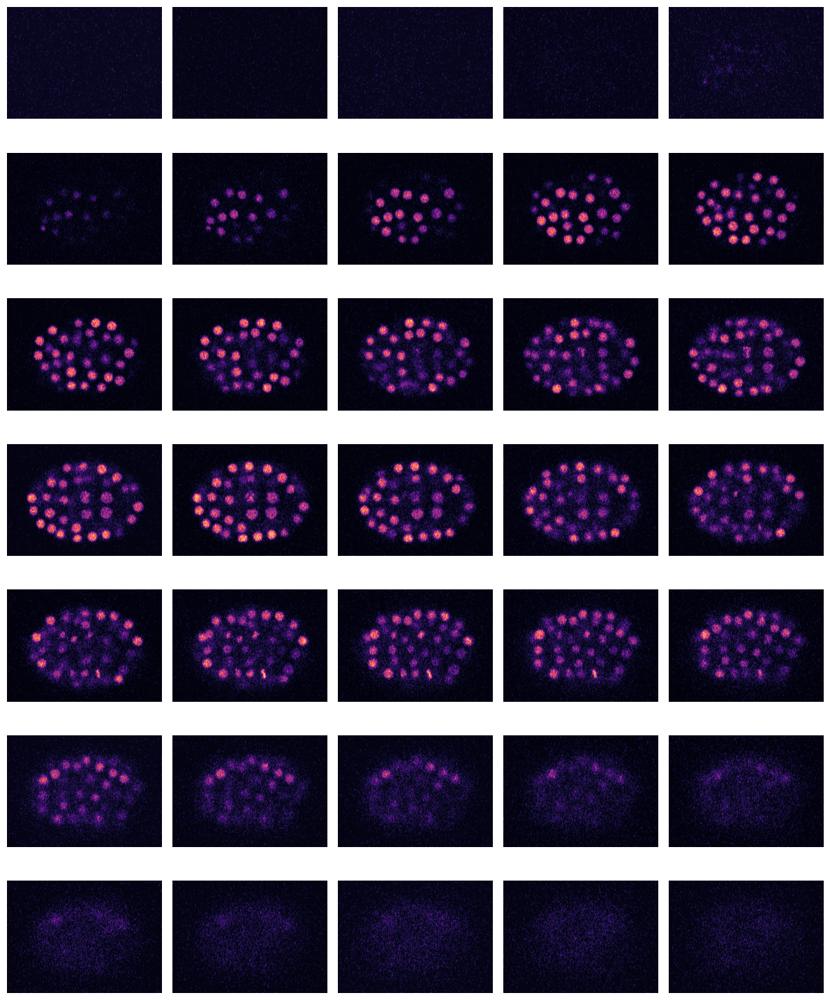

In [ ]:
#here the plotted images are the flourscenec microscopy images 
arr_images = load_img_from_tiff("/content/Fluo-N3DH-CE-2/01/t100.tif")
display_images(arr_images)

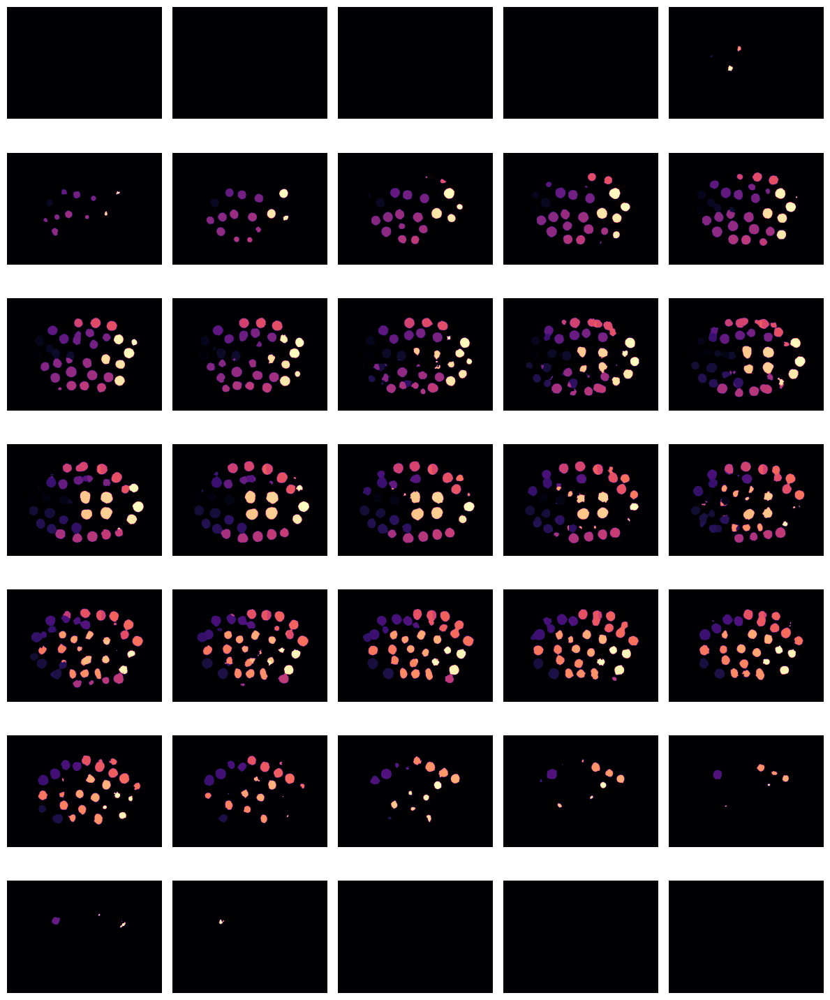

In [ ]:
#Here the images are the grouth truth segmentation of flouroscenes images 
arr_images = load_img_from_tiff("/content/Fluo-N3DH-CE-2/01_ST/SEG/man_seg100.tif")
display_images(arr_images)

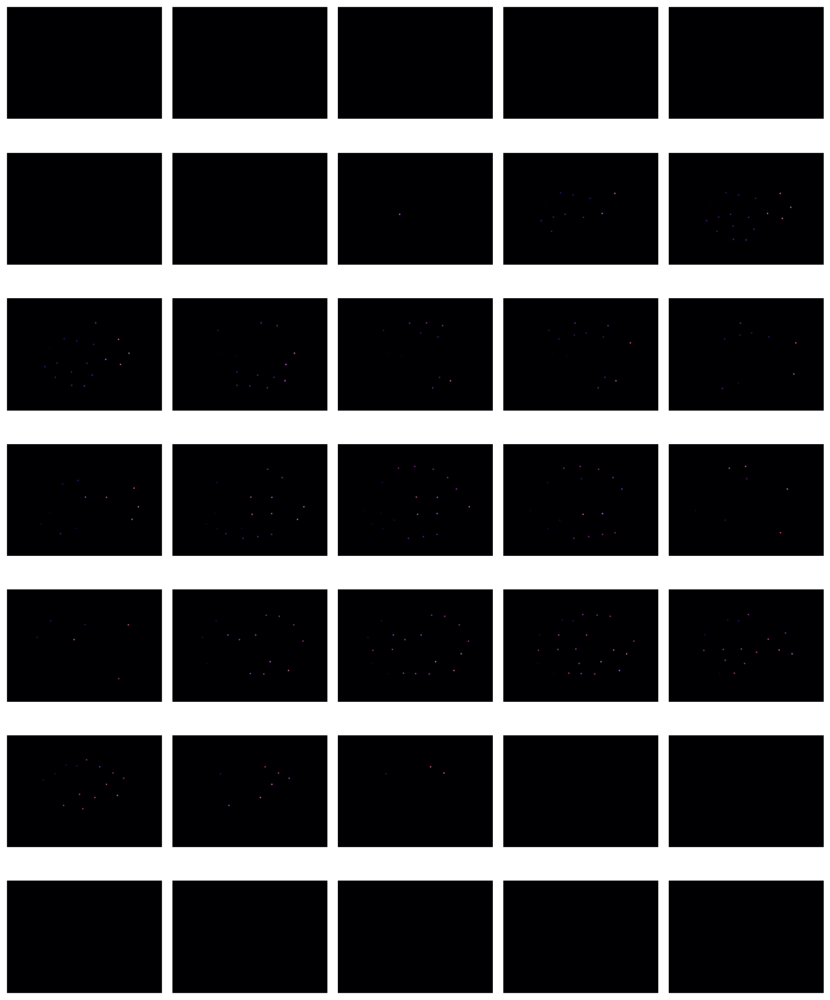

In [ ]:
# The images represent the centroid position of nucleus in 3dimesion
arr_images = load_img_from_tiff("/content/Fluo-N3DH-CE-2/01_GT/TRA/man_track100.tif")
display_images(arr_images)

In [ ]:
#here the images in the mentioned are almost corrupted the dimension of image is varied 
arr_images = load_img_from_tiff("/content/Fluo-N3DH-CE-2/01_GT/SEG/man_seg_028_018.tif")
# display_images(arr_images)
arr_images[0].shape

(708,)

In [ ]:
# # The images represent the centroid position of nucleus in 3dimesion
# arr_images = load_img_from_tiff("/content/Fluo-N3DH-CE-2/01_GT/SEG/man_seg_028_018.tif")
# # display1_images(arr_images)

In [ ]:
# making different dirtectoris for extracting tif to png and jpeg format 
!mkdir features
!mkdir segmentation_maps
!mkdir features_jpeg
!mkdir segmentation_maps_jpeg

In [ ]:
#here the tiffs are iterated over and stored in different directories as png and jpeg format
from tqdm import tqdm

for t in tqdm(range(194)):
  t3 = f"{t:03}"
  feature_path="/content/Fluo-N3DH-CE-2/01/t"+str(t3)+".tif"
  seg_map_path="/content/Fluo-N3DH-CE-2/01_ST/SEG/man_seg"+str(t3)+".tif"
  features_arr = load_img_from_tiff(feature_path)
  seg_arr = load_img_from_tiff(seg_map_path)
  
  for i in range(len(features_arr)):
    cv2.imwrite('/content/features_jpeg/F'+str(t)+'_'+str(i)+'.jpeg', features_arr[i])
    cv2.imwrite('/content/segmentation_maps_jpeg/L'+str(t)+'_'+str(i)+'.jpeg', seg_arr[i])
    cv2.imwrite('/content/features/F'+str(t)+'_'+str(i)+'.png', features_arr[i])
    cv2.imwrite('/content/segmentation_maps/L'+str(t)+'_'+str(i)+'.png', seg_arr[i])

100%|██████████| 194/194 [02:45<00:00,  1.18it/s]


In [ ]:
#Here all images are stored in the png , jpeg formats and two folders represent ground truth and segmentation maps
features_path, label_path, features_path_jpeg, label_path_jpeg = "/content/features/", "/content/segmentation_maps/", "/content/features_jpeg/", "/content/segmentation_maps_jpeg/"

In [ ]:
#resizing whole images which are in png and jpeg format
from PIL import Image
import os, sys

def resize(path, mode):
  dirs = os.listdir( path )
  for item in tqdm(dirs):
    if os.path.isfile(path+item):
      im = Image.open(path+item)
      f, e = os.path.splitext(path+item)
      imResize = im.resize((256,256), Image.NEAREST)
      imResize.save(f+e, mode, quality=100)
      
resize(features_path, mode='PNG')
resize(label_path, mode='PNG')
resize(features_path_jpeg, mode='JPEG')
resize(label_path_jpeg, mode='JPEG')


100%|██████████| 6790/6790 [00:14<00:00, 459.56it/s]


In [ ]:
#compression loss of images which are in png format
z = plt.imread("/content/segmentation_maps_jpeg/L150_25.jpeg")
fig = go.Figure(data=[go.Surface(z=z)])
fig.update_layout(title='PNG', autosize=False,
                  width=500, height=500,
                  margin=dict(l=65, r=50, b=65, t=90))
fig.show()

In [ ]:
# compression loss of images in jpeg format
z=plt.imread("/content/segmentation_maps_jpeg/L150_25.jpeg")
fig = go.Figure(data=[go.Surface(z=z)])
fig.update_layout(title='JPEG format', autosize=False,
                  width=500, height=500,
                  margin=dict(l=65, r=50, b=65, t=90))
fig.show()

In [ ]:
!mkdir output

In [ ]:
# The code is to convert tiff file format to gif and save it in a different directory
from PIL import Image

def tif_to_gif(tif_file, output_gif):
    # Open the TIF file
    tif_image = Image.open(tif_file)

    # Create a list to store each frame of the animation
    frames = []

    try:
        # Iterate through all frames in the TIF file
        while True:
            # Append the current frame to the list
            frames.append(tif_image.copy())

            # Move to the next frame
            tif_image.seek(len(frames))

    except EOFError:
        pass

    # Save the frames as a GIF animation
    frames[0].save(output_gif, format='GIF',
                   append_images=frames[1:],
                   save_all=True,
                   duration=200,  # Set the duration for each frame (in milliseconds)
                   loop=0)  # Set the number of loops (0 means infinite loop)

    print(f"GIF animation saved as '{output_gif}'.")

# Example usage
tif_file_path = "/content/Fluo-N3DH-CE-2/01/t100.tif"
output_gif_path = "/content/output/output2.gif"
tif_to_gif(tif_file_path, output_gif_path)


GIF animation saved as '/content/output/output2.gif'.


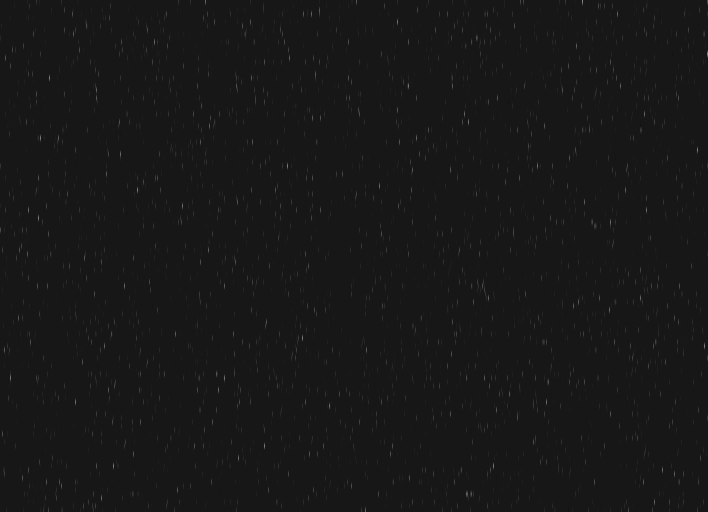

In [ ]:
#ploting the tif file 
from PIL import Image
from IPython.display import Image as IPImage
from IPython.display import display

def play_gif(gif_file):
    # Open the GIF file
    gif_image = Image.open(gif_file)

    # Display the GIF animation
    display(IPImage(gif_file))

# Example usage
output_gif_path = "/content/output/output2.gif"
play_gif(output_gif_path)


In [ ]:
from PIL import Image

# open the TIF file
with Image.open("/content/Fluo-N3DH-CE-2/01/t100.tif") as img:
    
    # print general information
    print('Filename:', img.filename)
    print('Format:', img.format)
    print('Size:', img.size)
    print('Mode:', img.mode)
    
    # print detailed information
    print('Info:', img.info)
    print('Tags:', img.tag_v2)
    


Filename: /content/Fluo-N3DH-CE-2/01/t100.tif
Format: TIFF
Size: (708, 512)
Mode: L
Info: {'compression': 'tiff_lzw', 'dpi': (282221.94, 282221.94)}
Tags: {256: 708, 257: 512, 258: (8,), 259: 5, 262: 1, 266: 1, 273: (8, 1231, 2497, 3798, 5158, 6309, 7537, 8708, 9957, 11185, 12314, 13471, 14680, 15814, 16822, 17960, 19106, 20235, 21491, 22680, 23946, 25103, 26201, 27335, 28496, 29658, 30947, 32159, 33297, 34436, 35615, 36947, 38159, 39370, 40594, 42000, 43248, 44492, 45542, 46590, 47736, 48817, 49885, 51027, 52214, 53339, 54589), 274: 1, 339: (1,), 277: 1, 278: 11, 279: (1223, 1266, 1301, 1360, 1151, 1228, 1171, 1249, 1228, 1129, 1157, 1209, 1134, 1008, 1138, 1146, 1129, 1256, 1189, 1266, 1157, 1098, 1134, 1161, 1162, 1289, 1212, 1138, 1139, 1179, 1332, 1212, 1211, 1224, 1406, 1248, 1244, 1050, 1048, 1146, 1081, 1068, 1142, 1187, 1125, 1250, 835), 282: 111111.0, 283: 111111.0, 284: 1, 286: 0.0, 287: 0.0, 296: 3, 297: (0, 35), 65000: 0.0, 65001: 10000.0, 254: 2}


In [ ]:
# # The images represent the centroid position of nucleus in 3dimesion
# arr_images = load_img_from_tiff("/content/Fluo-N3DH-CE-2/01_GT/SEG/man_seg_028_018.tif")
# display_images(arr_images)

In [25]:
!cp -r /content/features /content/drive/MyDrive/my_data/celltrackingchallenge/
!cp -r /content/segmentation_maps /content/drive/MyDrive/my_data/celltrackingchallenge/
!cp -r /content/segmentation_maps_jpeg /content/drive/MyDrive/my_data/celltrackingchallenge/
!cp -r /content/features_jpeg /content/drive/MyDrive/my_data/celltrackingchallenge/